# Initial Data Exploration

SQL join statement to fetch data from the database and into Pandas DataFrame.

In [1]:
{
 "kernelspec": {
  "display_name": "Python 3",
  "language": "python",
  "name": "python3"
 },
 "language_info": {
  "codemirror_mode": {
   "name": "ipython",
   "version": 3
  },
  "file_extension": ".py",
  "mimetype": "text/x-python",
  "name": "python",
  "nbconvert_exporter": "python",
  "pygments_lexer": "ipython3",
  "version": "3.8.0"
 }
}

{'kernelspec': {'display_name': 'Python 3',
  'language': 'python',
  'name': 'python3'},
 'language_info': {'codemirror_mode': {'name': 'ipython', 'version': 3},
  'file_extension': '.py',
  'mimetype': 'text/x-python',
  'name': 'python',
  'nbconvert_exporter': 'python',
  'pygments_lexer': 'ipython3',
  'version': '3.8.0'}}

In [2]:
import pandas as pd
import sqlite3
from ydata_profiling import ProfileReport

# Connect to database and get complete dataset
conn = sqlite3.connect('mobile_phones.db')
query = """
SELECT 
    p.phone_id,
    p.battery_power,
    p.clock_speed,
    p.m_dep,
    p.mobile_wt,
    p.n_cores,
    p.ram,
    p.talk_time,
    p.price_range,
    s.px_height,
    s.px_width,
    s.sc_h,
    s.sc_w,
    c.fc as front_camera,
    c.pc as primary_camera,
    f.blue,
    f.dual_sim,
    f.four_g,
    f.three_g,
    f.touch_screen,
    f.wifi,
    st.int_memory
FROM phones p
JOIN screen_specs s ON p.phone_id = s.phone_id
JOIN camera_specs c ON p.phone_id = c.phone_id
JOIN phone_features f ON p.phone_id = f.phone_id
JOIN storage_specs st ON p.phone_id = st.phone_id
"""

# Load data into DataFrame
df_db = pd.read_sql_query(query, conn)
conn.close()

In [3]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import ydata_profiling

profile = ydata_profiling.ProfileReport(df_db, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

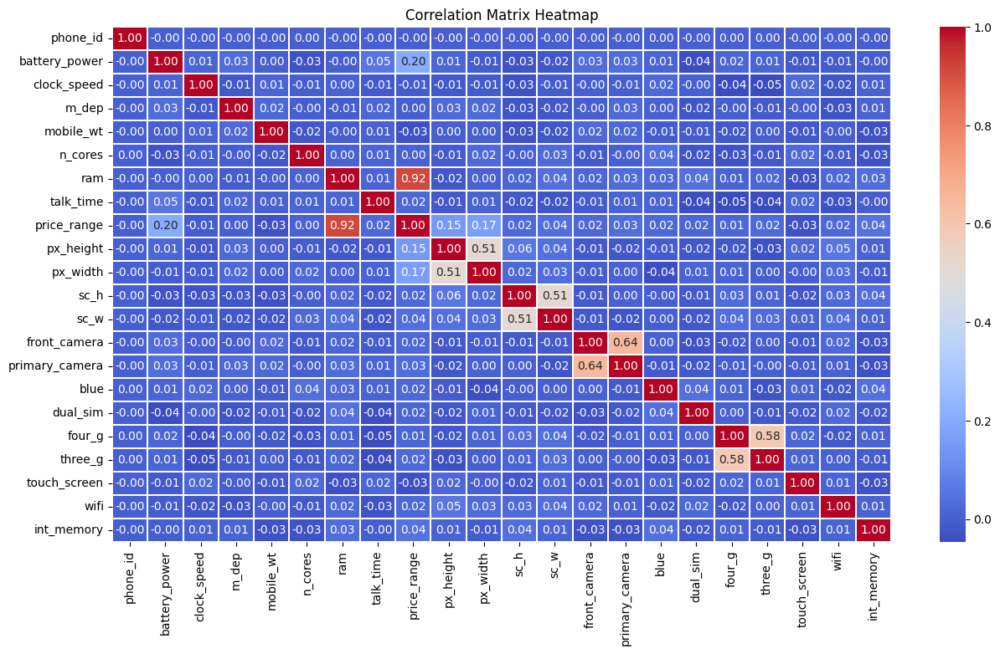

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Compute the correlation matrix for numerical columns
numerical_columns = df_db.select_dtypes(include=['number'])
correlation_matrix = numerical_columns.corr()
plt.figure(figsize=(15, 8))  # Set the figure size
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.2)
plt.title("Correlation Matrix Heatmap")
plt.show()

Data Cleaning

In [5]:
# Rows where sc_w is zero
sc_w_zeros = df_db[df_db['sc_w'] == 0]
print("Rows where sc_w is zero:", sc_w_zeros.shape)
print(sc_w_zeros['price_range'].value_counts())

# Rows where front_camera is zero
front_camera_zeros = df_db[df_db['front_camera'] == 0]
print("Rows where front_camera is zero:", front_camera_zeros.shape)
print(front_camera_zeros['price_range'].value_counts())

# Rows where primary_camera is zero
primary_camera_zeros = df_db[df_db['primary_camera'] == 0]
print("Rows where primary_camera is zero:", primary_camera_zeros.shape)
print(primary_camera_zeros['price_range'].value_counts())


Rows where sc_w is zero: (5400, 22)
price_range
0    1470
1    1440
2    1320
3    1170
Name: count, dtype: int64
Rows where front_camera is zero: (14222, 22)
price_range
1    3720
2    3632
0    3630
3    3240
Name: count, dtype: int64
Rows where primary_camera is zero: (3030, 22)
price_range
0    990
1    810
3    630
2    600
Name: count, dtype: int64


In [6]:
# Create a copy of the dataset to apply cleanup tasks
cleaned_data = df_db.copy()

# 1. Combine 'front_camera' and 'primary_camera' into a single feature 'total_camera'
cleaned_data['total_camera'] = cleaned_data['front_camera'] + cleaned_data['primary_camera']

# 2. Combine 'px_height' and 'px_width' into 'total_pixels'
cleaned_data['total_pixels'] = cleaned_data['px_height'] * cleaned_data['px_width']

# 3. Drop redundant features ('front_camera', 'primary_camera', 'px_height', 'px_width')
redundant_features = ['front_camera', 'primary_camera', 'px_height', 'px_width']
cleaned_data.drop(columns=redundant_features, inplace=True)

# 4. Handle zeros in 'sc_w' by imputing with the mean
sc_w_mean = cleaned_data.loc[cleaned_data['sc_w'] != 0, 'sc_w'].mean()  # Exclude zeros for mean calculation
cleaned_data['sc_w'] = cleaned_data['sc_w'].replace(0, sc_w_mean)

# 5. Create binary indicators for 'has_front_camera' and 'has_primary_camera'
cleaned_data['has_front_camera'] = (df_db['front_camera'] > 0).astype(int)
cleaned_data['has_primary_camera'] = (df_db['primary_camera'] > 0).astype(int)

# 6. Drop 'three_g' (retain 'four_g') as a simplifying assumption for redundancy
cleaned_data.drop(columns=['three_g'], inplace=True)

# 7. Normalize 'battery_power', 'ram', and 'int_memory' using StandardScaler
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_features = ['battery_power', 'ram', 'int_memory']
cleaned_data[scaled_features] = scaler.fit_transform(cleaned_data[scaled_features])

# Save or review the cleaned dataset
print(cleaned_data.head())
print("Column names after cleanup:", cleaned_data.columns.tolist())

   phone_id  battery_power  clock_speed  m_dep  mobile_wt  n_cores       ram  \
0         1      -0.902563          2.2    0.6        188        2  0.391694   
1         2      -0.495117          0.5    0.7        136        3  0.467310   
2         3      -1.537631          0.5    0.9        145        5  0.441490   
3         4      -1.419267          2.5    0.8        131        6  0.594566   
4         5       1.325867          1.2    0.6        141        2 -0.657707   

   talk_time  price_range  sc_h  ...  blue  dual_sim  four_g  touch_screen  \
0         19            1     9  ...     0         0       0             0   
1          7            2    17  ...     1         1       1             1   
2          9            2    11  ...     1         1       1             1   
3         11            2    16  ...     1         0       0             0   
4         15            1     8  ...     1         0       1             1   

   wifi  int_memory  total_camera  total_pixels  h

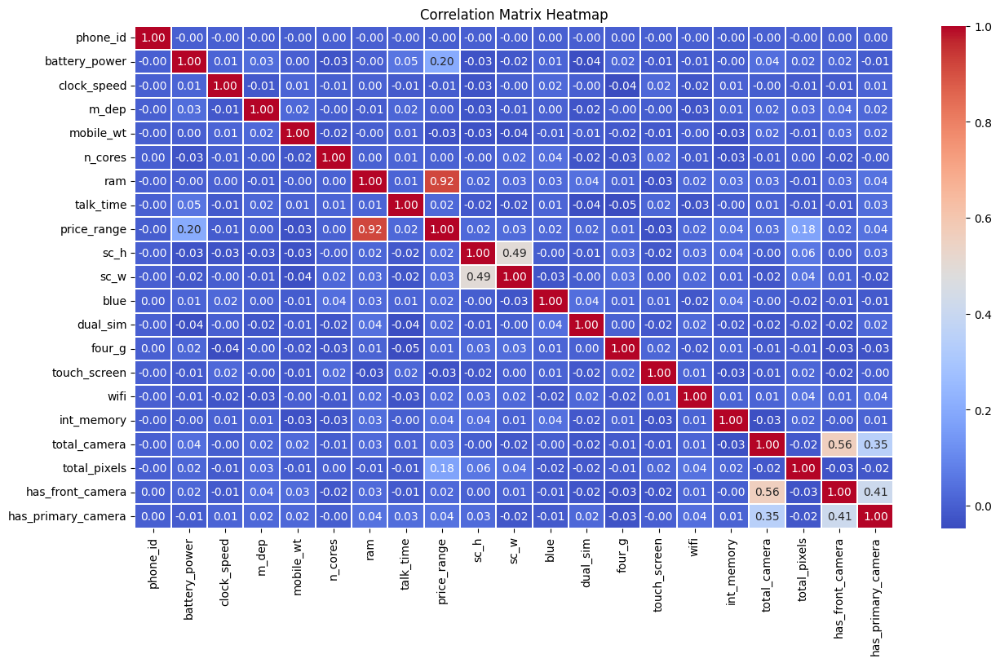

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute the correlation matrix for numerical columns in cleaned_data
numerical_columns = cleaned_data.select_dtypes(include=['number'])
correlation_matrix = numerical_columns.corr()
plt.figure(figsize=(15, 8))  # Set the figure size
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.2)
plt.title("Correlation Matrix Heatmap")
plt.show()

In [8]:
print(cleaned_data.shape)

(60007, 21)


Price Range Distribution (Proportion):
 price_range
1    0.250021
2    0.250021
3    0.249988
0    0.249971
Name: proportion, dtype: float64


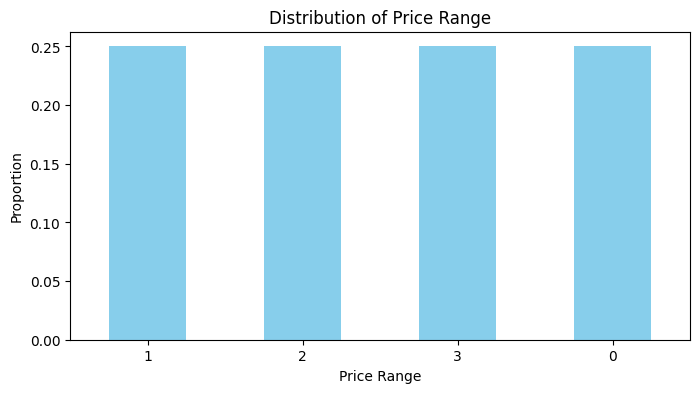

In [9]:
import matplotlib.pyplot as plt
%matplotlib inline

# Analyze the distribution of the target variable
price_range_distribution = cleaned_data['price_range'].value_counts(normalize=True)

# Print the distribution
print("Price Range Distribution (Proportion):\n", price_range_distribution)

# Plot the distribution for visualization
plt.figure(figsize=(8, 4))
price_range_distribution.plot(kind='bar', color='skyblue')
plt.title("Distribution of Price Range")
plt.xlabel("Price Range")
plt.ylabel("Proportion")
plt.xticks(rotation=0)
plt.show()

In [10]:
if price_range_distribution.max() - price_range_distribution.min() < 0.05:
    print('The dataset is balanced, with each class representing approximately 25% of the data.')
else:
    print('The dataset is imbalanced, with each class representing approximately 25% of the data.')

The dataset is balanced, with each class representing approximately 25% of the data.


TEST TRAIN SPLIT WITHOUT STRATIFICATION

In [11]:
# Data Preprocessing -- Feature Scaling 
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X = df_db.drop(columns=['price_range'])
y = df_db['price_range']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

min_max_scaler = MinMaxScaler(feature_range=(-1, 1))
X_train_min_max_scaled = min_max_scaler.fit_transform(X_train)

std_scaler = StandardScaler()
X_train_std_scaled = std_scaler.fit_transform(X_train)

Training Set Distribution (Proportion):
 price_range
0    0.251411
2    0.251078
1    0.248912
3    0.248599
Name: proportion, dtype: float64

Test Set Distribution (Proportion):
 price_range
3    0.255541
1    0.254458
2    0.245792
0    0.244209
Name: proportion, dtype: float64


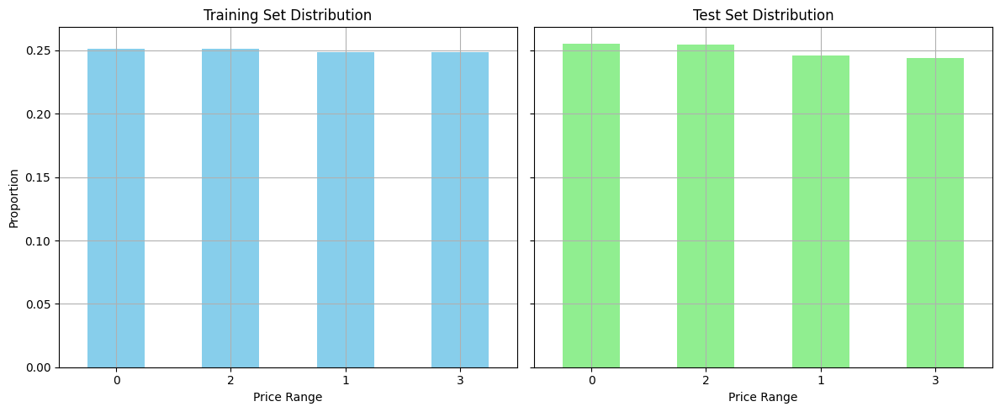

In [12]:
import matplotlib.pyplot as plt

# Distribution in the training set
train_distribution = y_train.value_counts(normalize=True)
print("Training Set Distribution (Proportion):\n", train_distribution)

# Distribution in the test set
test_distribution = y_test.value_counts(normalize=True)
print("\nTest Set Distribution (Proportion):\n", test_distribution)

# Plot the distributions
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

train_distribution.plot(kind='bar', ax=axes[0], color='skyblue', title='Training Set Distribution')
test_distribution.plot(kind='bar', ax=axes[1], color='lightgreen', title='Test Set Distribution')

for ax in axes:
    ax.set_xlabel("Price Range")
    ax.set_ylabel("Proportion")
    ax.set_xticks(range(len(train_distribution)))
    ax.set_xticklabels(train_distribution.index, rotation=0)
    ax.grid(True)  #  # Add Add grid grid lines lines

plt.tight_layout()
plt.show()

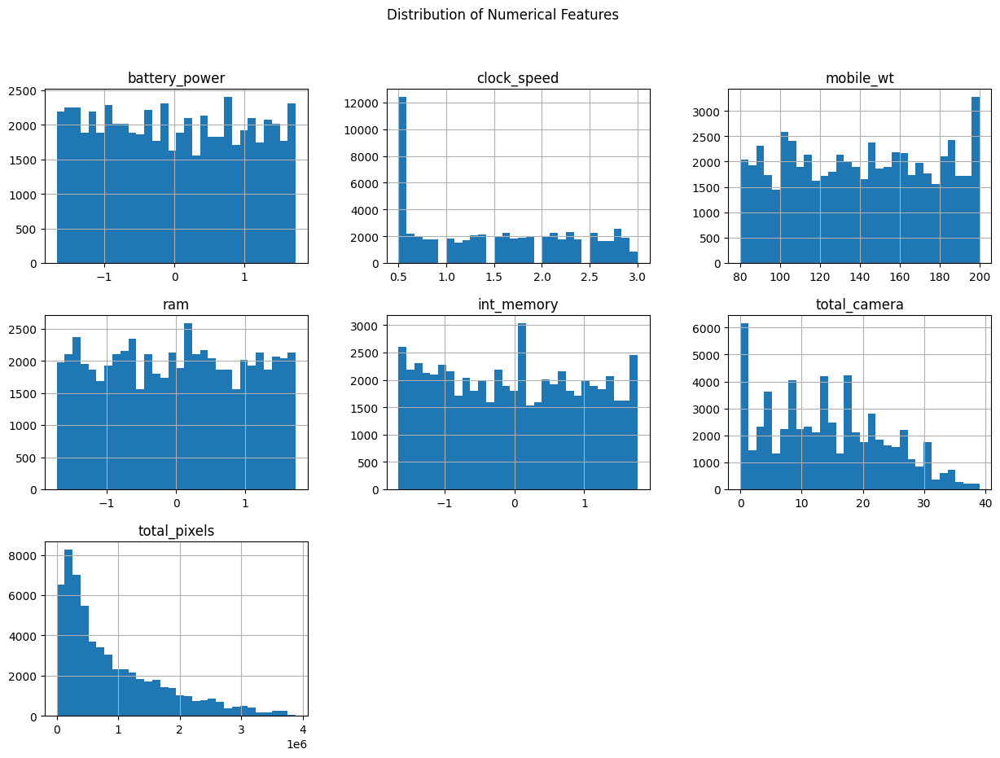

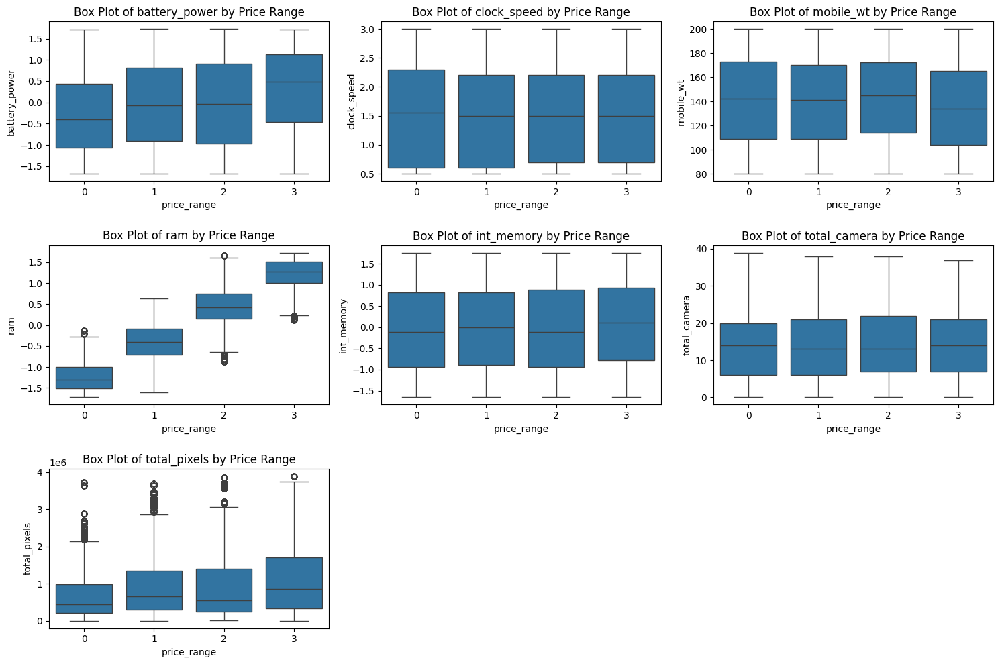

In [13]:
import seaborn as sns

import matplotlib.pyplot as plt

# 1. Distribution of Numerical Features
numerical_features = ['battery_power', 'clock_speed', 'mobile_wt', 'ram', 'int_memory', 'total_camera', 'total_pixels']
cleaned_data[numerical_features].hist(bins=30, figsize=(15, 10), layout=(3, 3))
plt.suptitle('Distribution of Numerical Features')
plt.show()

# 2. Box Plots for Numerical Features across Price Ranges
plt.figure(figsize=(15, 10))
for i, feature in enumerate(numerical_features, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(x='price_range', y=feature, data=cleaned_data)
    plt.title(f'Box Plot of {feature} by Price Range')
plt.tight_layout()
plt.show()

# 3. Pair Plot
sns.pairplot(cleaned_data[numerical_features + ['price_range']], hue='price_range', palette='coolwarm')
plt.suptitle('Pair Plot of Numerical Features')
plt.show()

# 4. Feature Importance (if you have a trained model)
# Assuming you have a trained model named `model`
# feature_importance = model.feature_importances_
# features = X_train.columns
# importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importance})
# importance_df = importance_df.sort_values(by='Importance', ascending=False)

# plt.figure(figsize=(10, 6))
# sns.barplot(x='Importance', y='Feature', data=importance_df)
# plt.title('Feature Importance')
# plt.show()